In [3]:
import numpy as np
import modin.pandas as pd 
import geopandas as gpd
import matplotlib.pyplot as plt
import osmnx as ox
import networkx as nx
from descartes import PolygonPatch
from shapely.geometry import Point, Polygon, MultiPolygon, LineString
from tqdm.auto import tqdm
import shapely.speedups
shapely.speedups.enable() 
import warnings
warnings.filterwarnings('ignore')

In [4]:
PLACE_NAME = 'Kaiserslautern, Germany'
name = 'Kaiserslautern'
grid_size = 500

epsg:4326
+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs
<class 'shapely.geometry.polygon.Polygon'>


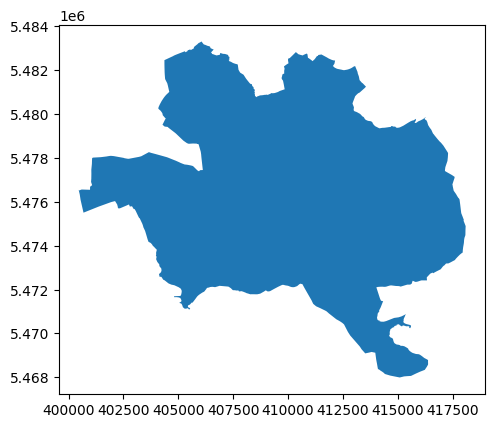

In [5]:
city = ox.geocode_to_gdf(PLACE_NAME)
print(city.crs)
## changing CRS for grid division
city = ox.project_gdf(city) 
print(city.crs)
ax = city.plot()
geometry = city['geometry'].iloc[0]
print(type(geometry))

In [6]:
#save geometry
city.to_file(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}.shp")

#### Division into grid

In [7]:
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width=grid_size) #500 Meter grid
print(type(geometry_cut))
polylist = [poly for poly in geometry_cut.geoms]

<class 'shapely.geometry.multipolygon.MultiPolygon'>


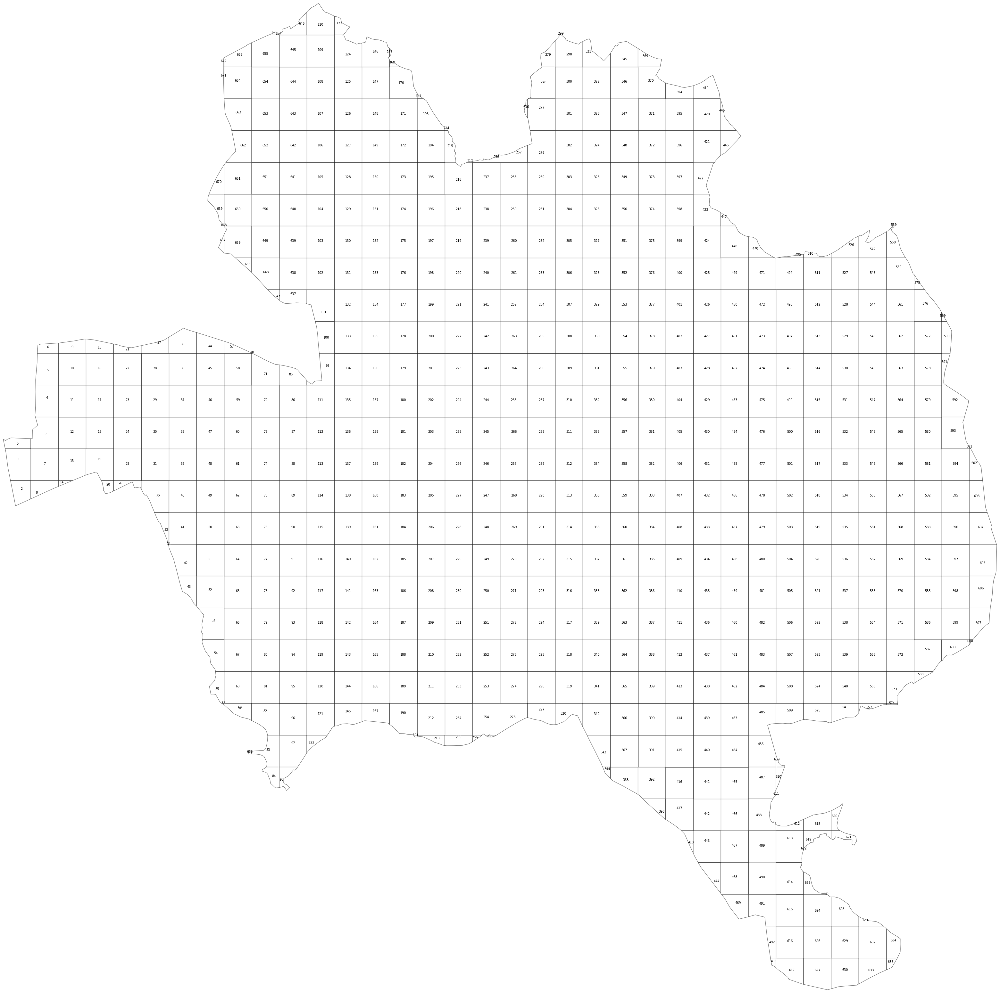

In [8]:
polylist = [poly for poly in geometry_cut.geoms]
# plot city
west, south, east, north = city.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut.geoms, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=7)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [9]:
city_polyframe = gpd.GeoDataFrame(geometry=polylist)
city_polyframe.crs = city.crs
print(city_polyframe.crs)
city_polyframe.head()

+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


,geometry
0,"POLYGON ((400458.288 5476542.074, 400500.207 5..."
1,"POLYGON ((400948.290 5476390.126, 400948.290 5..."
2,"POLYGON ((400948.290 5475896.012, 400948.290 5..."
3,"POLYGON ((400948.290 5476547.564, 400974.586 5..."
4,"POLYGON ((401029.465 5476884.241, 401022.664 5..."


(6335947.0334054055, 6359295.451021649)

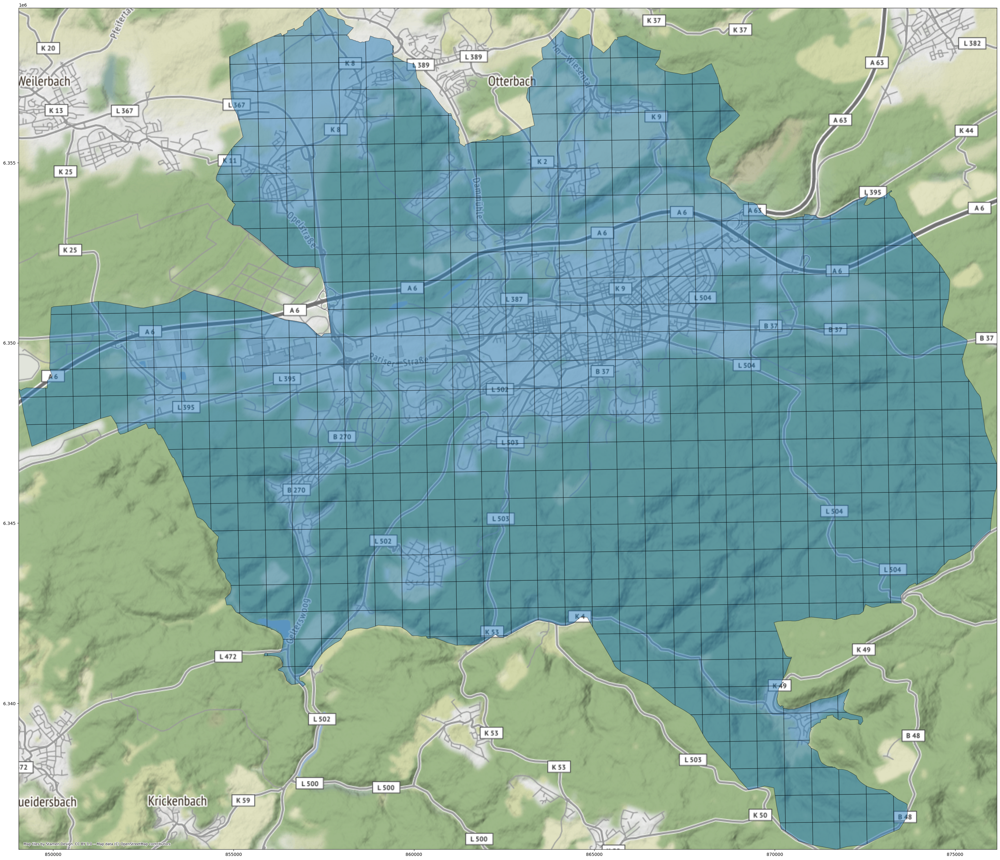

In [10]:
import contextily as ctx
# ctx uses epsg:3857ax = city.plot()
polyframe_3857 = city_polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)

#### POIs
- Understanding each one of them and making dataset

In [11]:
city_polyframe_lat_long = ox.project_gdf(city_polyframe, to_latlong=True) #Changing CRS to (Lat, long)
city_polyframe_lat_long.head()

,geometry
0,"POLYGON ((7.62710 49.43339, 7.62769 49.43315, ..."
1,"POLYGON ((7.63389 49.43211, 7.63402 49.42767, ..."
2,"POLYGON ((7.63402 49.42767, 7.63409 49.42511, ..."
3,"POLYGON ((7.63386 49.43352, 7.63422 49.43352, ..."
4,"POLYGON ((7.63489 49.43656, 7.63479 49.43676, ..."


##### 1. EV stations

In [12]:
EV_stations = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "charging_station"},
)
EV_stations.head()
EV_stations.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-EV_stations.csv")

Text(0.5, 1.0, 'Berlin EV stations')

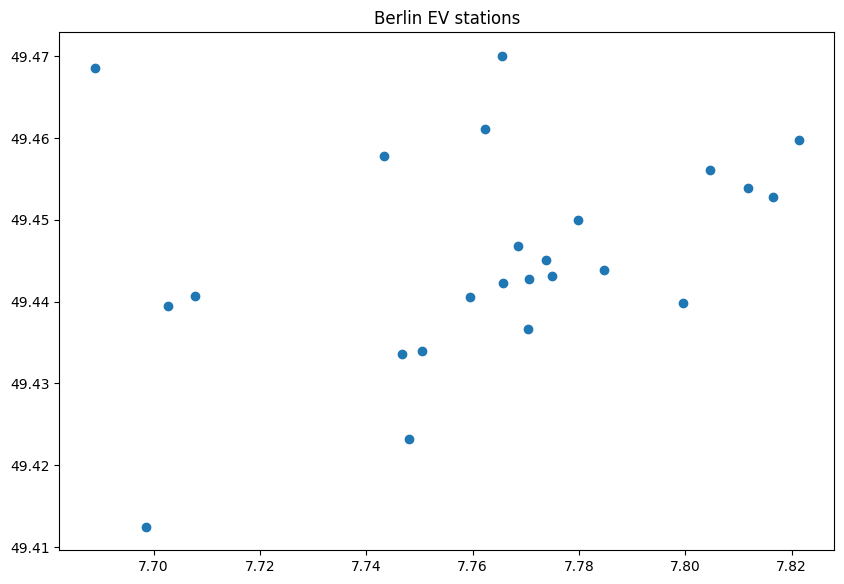

In [13]:
#plot EV stations geo data
EV_stations.plot(figsize=(10,10))
plt.title("Berlin EV stations")

Text(0.5, 1.0, 'Berlin EV stations')

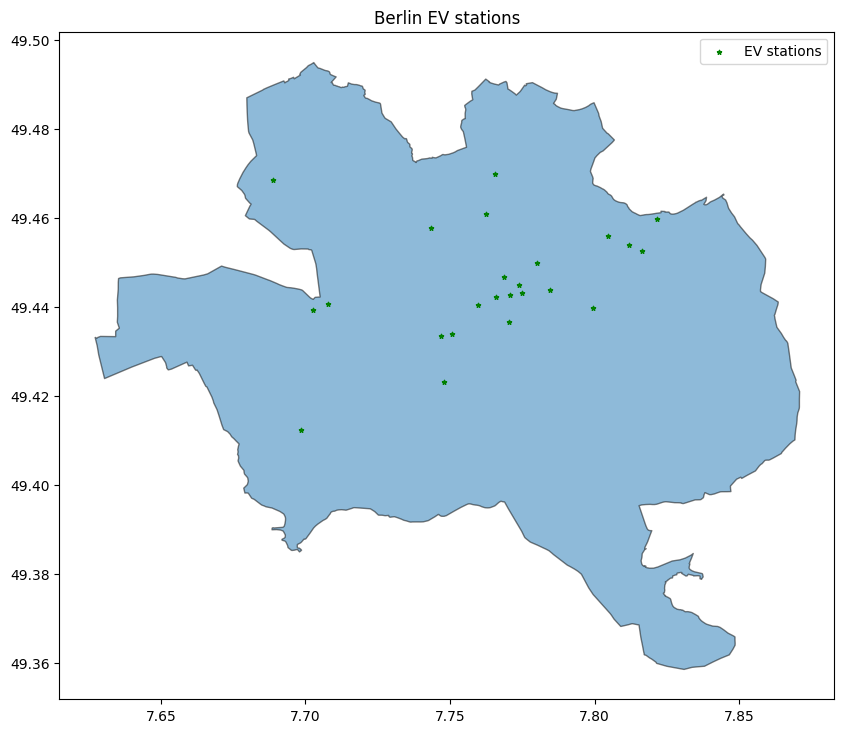

In [14]:
fig, ax = plt.subplots(figsize=(10,10))
ox.project_gdf(city, to_latlong=True).plot(ax =ax, alpha=0.5, edgecolor='k')
EV_stations.plot(ax=ax, color='green', marker='*', markersize=10)
#add legend
plt.legend(['EV stations'])
plt.title("Berlin EV stations")

In [15]:
list(EV_stations.columns)

['access',
 'amenity',
 'authentication:none',
 'bicycle',
 'capacity',
 'fee',
 'motorcar',
 'operator',
 'parking:fee',
 'scooter',
 'socket:schuko',
 'socket:type2',
 'geometry',
 'addr:city',
 'addr:country',
 'addr:housenumber',
 'addr:postcode',
 'addr:street',
 'amenity:wikipedia',
 'brand',
 'brand:wikidata',
 'brand:wikipedia',
 'name',
 'opening_hours',
 'socket:tesla_supercharger',
 'socket:tesla_supercharger:output',
 'socket:tesla_supercharger_ccs',
 'socket:tesla_supercharger_ccs:output',
 'truck',
 'website',
 'amperage',
 'operator:wikidata',
 'operator:wikipedia',
 'authentication:membership_card',
 'socket:chademo',
 'socket:chademo:output',
 'socket:type2:output',
 'socket:type2_combo',
 'socket:type2_combo:output',
 'power',
 'covered',
 'network',
 'name:en',
 'name:fr',
 'payment:account_cards',
 'payment:app']

In [16]:
assert np.sum(EV_stations['amenity'].values == 'charging_station') ==  len(EV_stations) #amenity column
### investigating important columns
EV_stations['geometry'].head() #geometry column

element_type  osmid     
node          3715545454    POINT (7.70269 49.43946)
              4646016094    POINT (7.70787 49.44074)
              4908848926    POINT (7.82142 49.45978)
              5257979765    POINT (7.74672 49.43359)
              5257979766    POINT (7.76861 49.44683)
Name: geometry, dtype: geometry

In [18]:
# #check null values out of toital values
# print(EV_stations['amperage'].isnull().sum() / len(EV_stations)) #amperage column
# print(EV_stations['voltage'].isnull().sum() / len(EV_stations)) #voltage column
# print(EV_stations['capacity'].isnull().sum() / len(EV_stations)) #capacity column
# print(EV_stations['socket:type2'].isnull().sum() / len(EV_stations)) #socket column
# #output column
# print(EV_stations['output'].isnull().sum() / len(EV_stations)) #output column
# #parking column
# print(EV_stations['parking'].isnull().sum() / len(EV_stations)) #parking column
# #charging_station:output column

In [19]:
#intersection of points and polygons
import shapely.speedups
shapely.speedups.enable() 

masks_EV = []
for i in tqdm(range(0,city_polyframe.shape[0])):
    pip_mask = EV_stations.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_EV.append(pip_mask)

/tmp/ipykernel_26522/3985573752.py:3: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()
100%|██████████| 673/673 [00:00<00:00, 51643.22it/s]


In [23]:
#extract ['amperage', 'voltage', 'amenity', 'capacity'] columns
EV_stations[masks_EV[75]][['geometry']]

,,geometry
element_type,osmid,


In [25]:
#EV stations in the 3022 grid (example)
# EV_stations[masks_EV[3022]][['amperage', 'voltage', 'amenity', 'capacity', 'geometry']]

In [27]:
# create a new geodataframe with mask EV stations 
EV_stations_masked = gpd.GeoDataFrame()
for i in tqdm(range(0,city_polyframe.shape[0])):
    EV_stations_masked = pd.concat([EV_stations_masked, EV_stations[masks_EV[i]][['geometry']]], ignore_index=True)

  0%|          | 0/673 [00:00<?, ?it/s]

100%|██████████| 673/673 [00:01<00:00, 568.75it/s]


In [21]:
# EV_stations[masks_EV[1438]]['amperage'].values.tolist()

[nan, '32']

In [28]:
berlin_polyframe_lat_long_new = city_polyframe_lat_long.copy()
berlin_polyframe_lat_long_new['EV_stations_counts'] = 0
# berlin_polyframe_lat_long_new['EV_stations_aperage'] = 0
# berlin_polyframe_lat_long_new['EV_stations_voltage'] = 0
# berlin_polyframe_lat_long_new['EV_stations_capacity'] = 0
berlin_polyframe_lat_long_new['EV_stations_geomery'] = 0

In [29]:
for i in tqdm(range(0,berlin_polyframe_lat_long_new.shape[0])):
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_counts'] = EV_stations[masks_EV[i]].shape[0]
    # berlin_polyframe_lat_long_new.loc[i, 'EV_stations_aperage'] = str(EV_stations[masks_EV[i]][['amperage']].values.tolist())
    # berlin_polyframe_lat_long_new.loc[i, 'EV_stations_voltage'] = str(EV_stations[masks_EV[i]][['voltage']].values.tolist())
    # berlin_polyframe_lat_long_new.loc[i, 'EV_stations_capacity'] = str(EV_stations[masks_EV[i]][['capacity']].values.tolist())
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_geomery'] = str(EV_stations[masks_EV[i]][['geometry']].values.tolist())

100%|██████████| 673/673 [00:01<00:00, 583.99it/s]


In [30]:
#How many EV stations in each grid
berlin_polyframe_lat_long_new['EV_stations_counts'].value_counts()
#Percentage of EV stations in each grid
berlin_polyframe_lat_long_new['EV_stations_counts'].value_counts() / berlin_polyframe_lat_long_new.shape[0]

EV_stations_counts
0    0.968796
1    0.028232
2    0.001486
3    0.001486
Name: count, dtype: float64

##### Population data visualize and add to each grid

In [31]:
#### Extract population data
df_pop = pd.read_csv("//home/akansh-i2sc/Downloads/Compressed/population_deu_2019-07-01.csv")
gdf = gpd.GeoDataFrame(df_pop, geometry=gpd.points_from_xy(df_pop.Lon, df_pop.Lat))

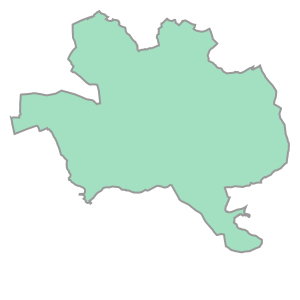

In [32]:
#extract population data for berlin
city.geometry[0]

In [33]:
# change crs to lat long
city_lat_long = ox.project_gdf(city, to_latlong=True)
pip_mask = gdf.within(city_lat_long.loc[0, 'geometry']) 

In [34]:
berlin_pop_gdf = gdf.loc[pip_mask]

<Axes: >

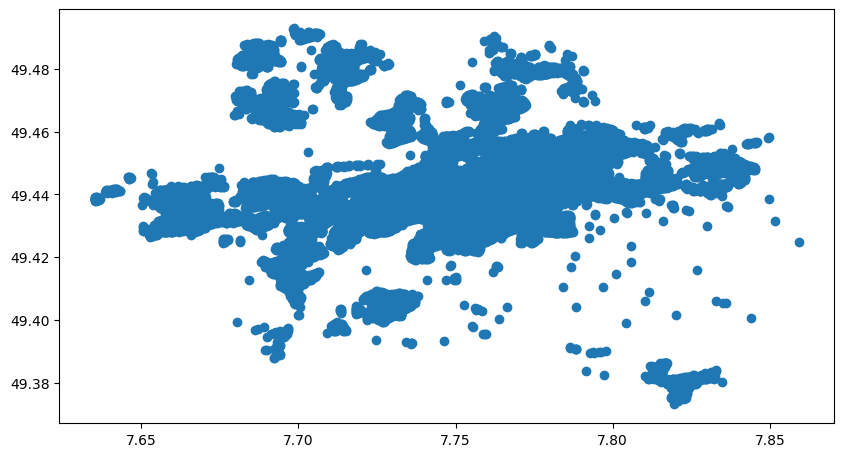

In [35]:
#plot population data with cmap
berlin_pop_gdf.plot(figsize=(10,10))

In [36]:
berlin_pop_gdf.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-population.csv")

In [37]:
# population for each grid
masks_pop = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = berlin_pop_gdf.within(city_polyframe_lat_long.loc[i, 'geometry'])
    masks_pop.append(pip_mask)

100%|██████████| 673/673 [00:00<00:00, 2047.79it/s]


In [38]:
pop_grid = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    pop_grid.append(berlin_pop_gdf.loc[masks_pop[i]].Population.mean())

In [39]:
pop_grid = np.nan_to_num(pop_grid)

In [40]:
berlin_polyframe_lat_long_new['population'] = pop_grid
berlin_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_geomery,population
0,"POLYGON ((7.62710 49.43339, 7.62769 49.43315, ...",0,[],0.000000
1,"POLYGON ((7.63389 49.43211, 7.63402 49.42767, ...",0,[],0.000000
2,"POLYGON ((7.63402 49.42767, 7.63409 49.42511, ...",0,[],0.000000
3,"POLYGON ((7.63386 49.43352, 7.63422 49.43352, ...",0,[],0.000000
4,"POLYGON ((7.63489 49.43656, 7.63479 49.43676, ...",0,[],3.666325


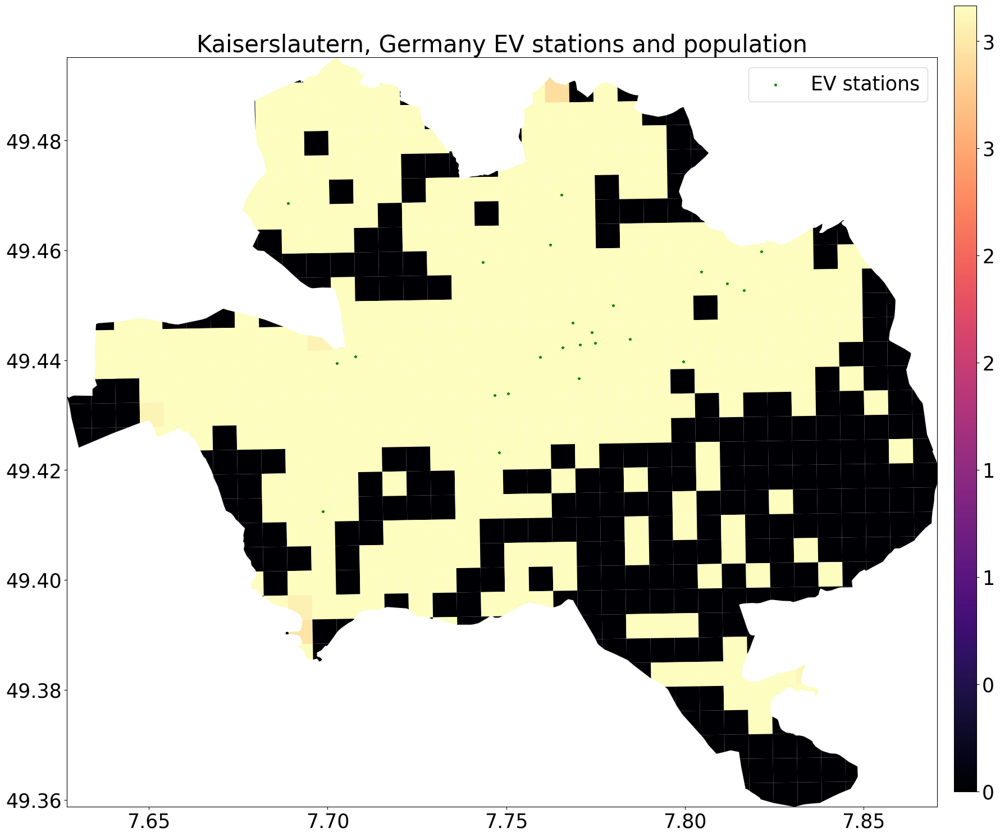

In [41]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'population', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['EV stations'])
plt.title(f'{PLACE_NAME} EV stations and population')
cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(berlin_polyframe_lat_long_new.population), vmax=max(berlin_polyframe_lat_long_new.population)))
sm._A = []
# draw colormap into cbax
fig.colorbar(sm, cax=cbax, format="%d")
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### LAnd_USE 

In [42]:
landuse = ox.geometries_from_place(PLACE_NAME, tags={'landuse': True})

# Define the categories
categories = {
    'residential': ['residential'],
    'commercial': ['commercial', 'retail', 'office', 'industrial'],
    'retail': ['retail'],
    'industrial': ['industrial']
}

# Create a new column to categorize the landuse types
landuse['category'] = 'Other'

# Iterate through the categories and assign the corresponding landuse types
for category, tags in categories.items():
    landuse.loc[landuse['landuse'].isin(tags), 'category'] = category

In [43]:
landuse.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-landuse.csv")

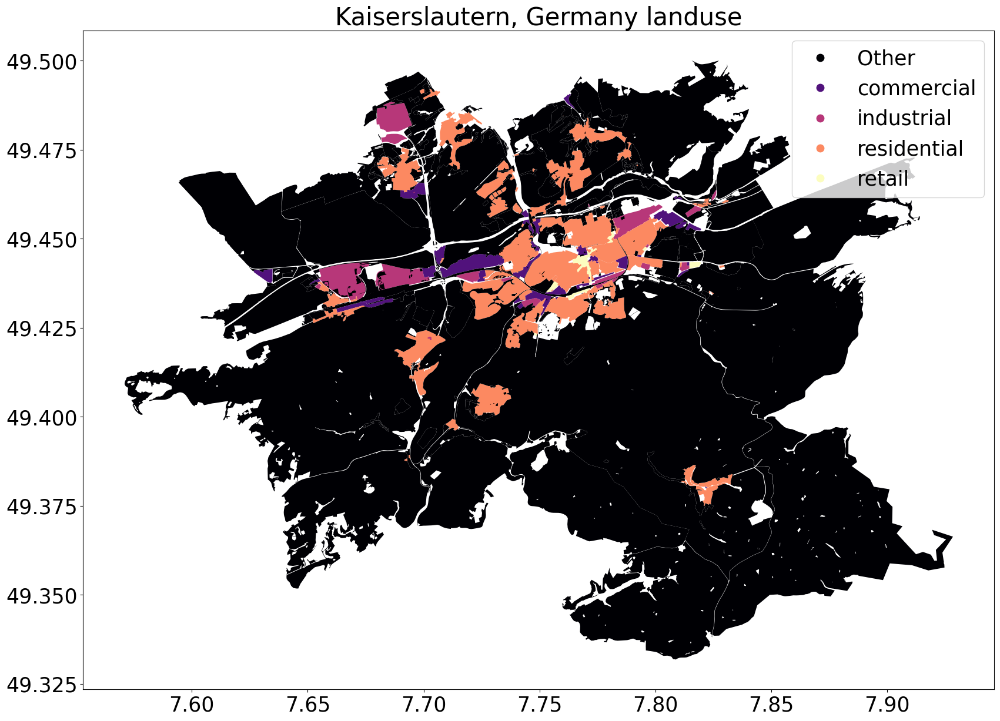

In [44]:
#plot node in landuse
fig, ax = plt.subplots(figsize=(20,20))
landuse.plot(ax=ax, column = 'category', legend=True, cmap='magma')
plt.title(f'{PLACE_NAME} landuse')
plt.show()

In [45]:
#create a copy of landuse drop everything except Category and geometry
landuse_cat = landuse[['category', 'geometry']].copy()

In [46]:
import shapely.speedups
shapely.speedups.enable()

/tmp/ipykernel_26522/3808896212.py:2: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()


In [47]:
masks_land_use = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = landuse_cat.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_land_use.append(pip_mask)
    assert pip_mask.shape[0] == landuse_cat.shape[0]

100%|██████████| 673/673 [00:00<00:00, 14900.27it/s]


In [48]:
land_labels = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    if landuse_cat[masks_land_use[i]].category.value_counts().isnull().all() == True:
        land_labels.append('Other')
    else:
        land_labels.append(landuse_cat[masks_land_use[i]].category.value_counts().index[0])

In [49]:
berlin_polyframe_lat_long_new['landuse'] = land_labels

In [50]:
berlin_polyframe_lat_long_new.landuse.value_counts()

landuse
Other          661
commercial       6
residential      3
industrial       3
Name: count, dtype: int64

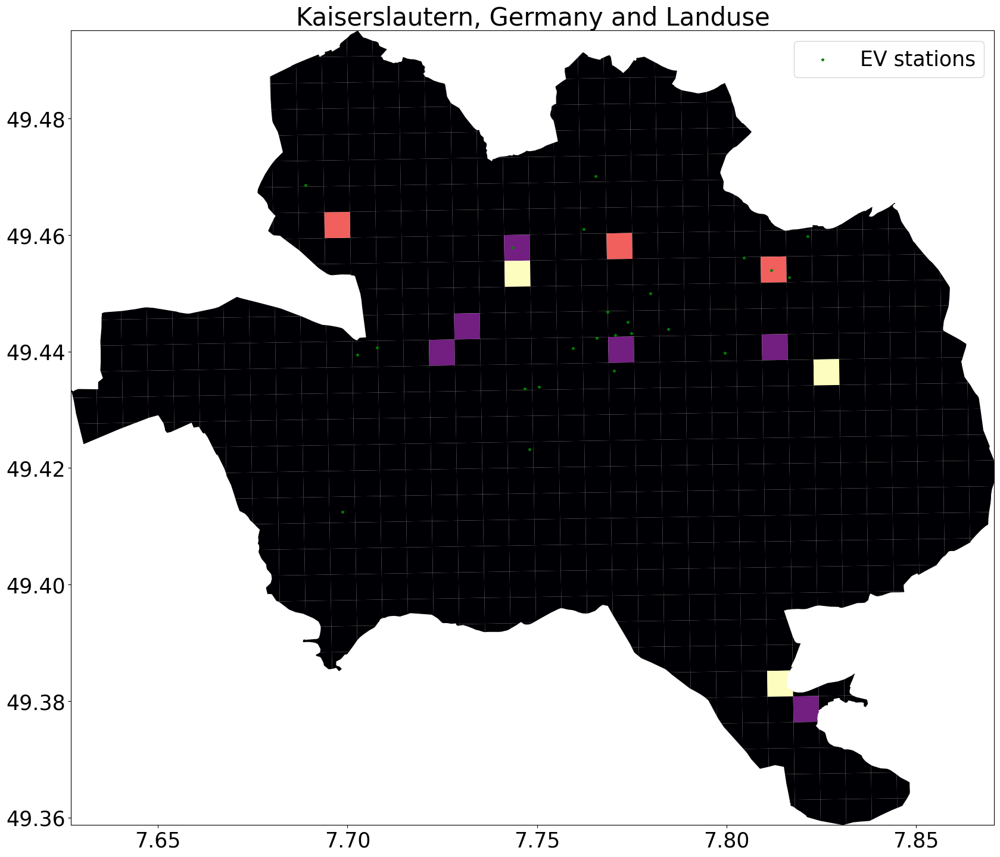

In [51]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'landuse', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
ax.legend()
# add legend
plt.title(f'{PLACE_NAME} and Landuse')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### Raod Connectivity

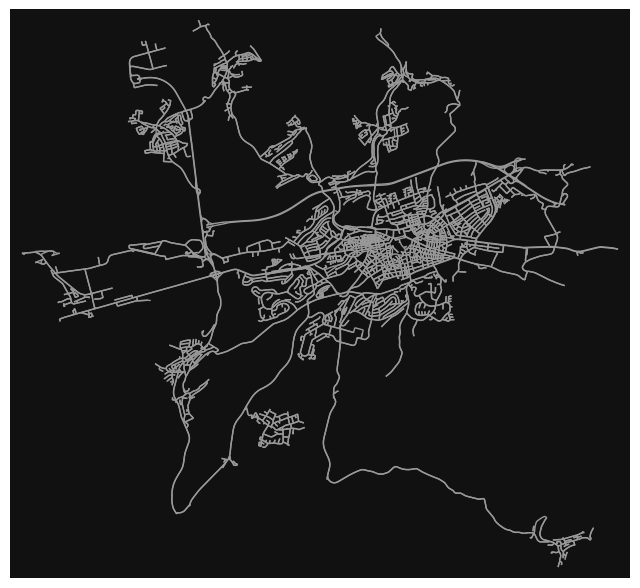

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [52]:
G = ox.graph_from_place(PLACE_NAME, network_type='drive')
ox.plot_graph(G, node_size= 0)

In [53]:
area,edges = ox.graph_to_gdfs(G)

In [55]:
# poly = city_polyframe_lat_long.loc[1254, 'geometry']
# G_1 = ox.graph_from_polygon(poly, network_type='drive')
# ox.plot_graph(G_1)

# #print number of nodes and edges and density
# print('Number of nodes in the graph: ', len(list(G_1.nodes())))
# print('Number of edges in the graph: ', len(list(G_1.edges())))
# print('Density of the graph: ', nx.density(G_1))

In [56]:
#calculate number of edges and nodes for each grid
nodes = []
edges = []
density = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    try: 
        poly = city_polyframe_lat_long.loc[i, 'geometry']
        G = ox.graph_from_polygon(poly, network_type='drive')
        nodes.append(len(list(G.nodes())))
        edges.append(len(list(G.edges())))
        density.append(nx.density(G))
    except:
        nodes.append(0)
        edges.append(0)
        density.append(0)


100%|██████████| 673/673 [04:12<00:00,  2.67it/s]


In [58]:
#add nodes, edges and density to the dataframe
berlin_polyframe_lat_long_new['nodes'] = nodes
berlin_polyframe_lat_long_new['edges'] = edges
berlin_polyframe_lat_long_new['density'] = density

In [59]:
#relation between EV stations and nodes

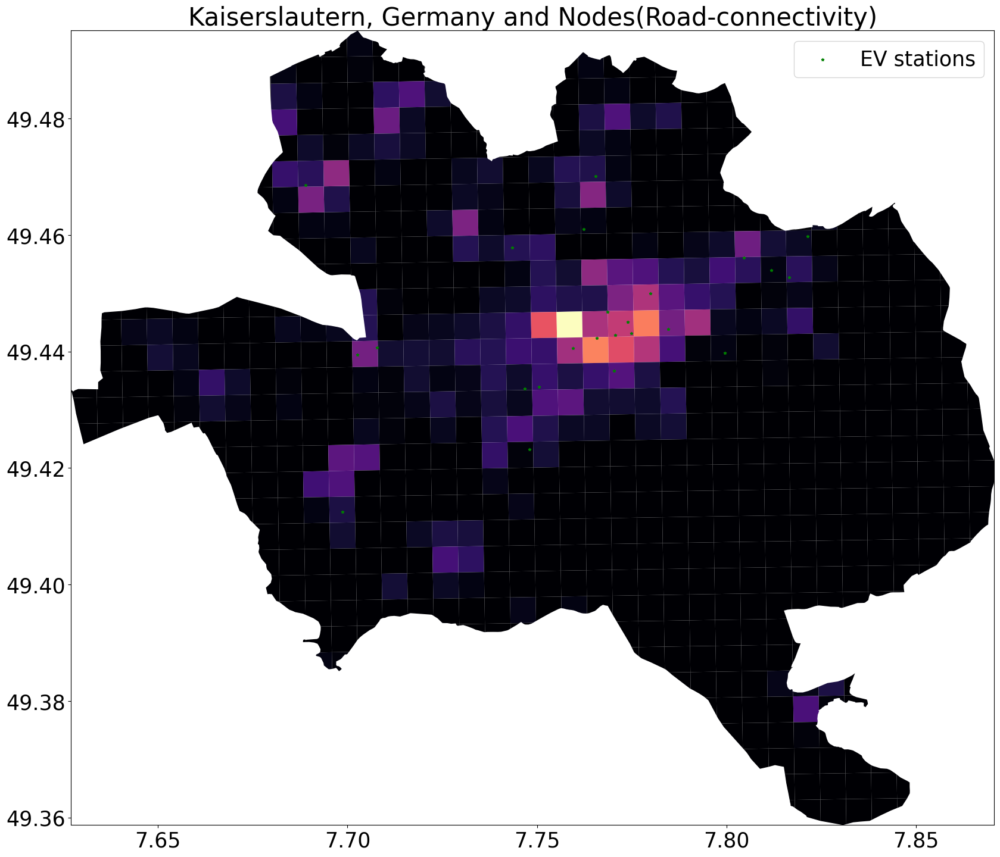

In [60]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'nodes', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Nodes(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

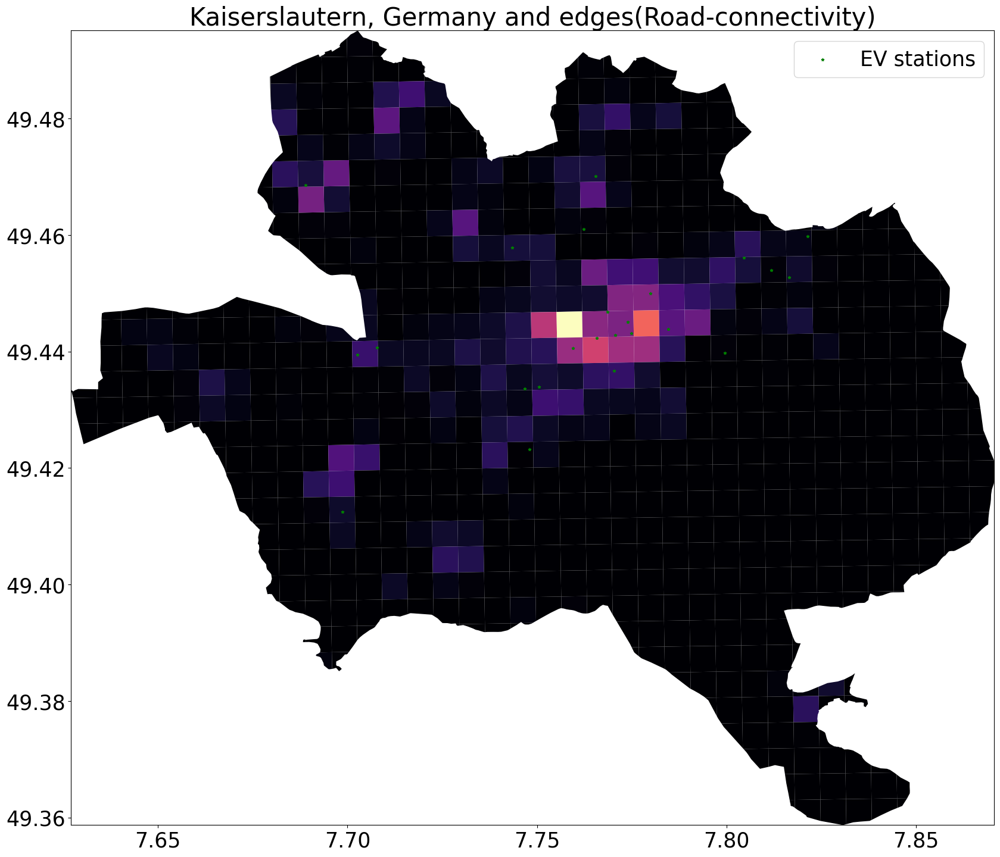

In [61]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'edges', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and edges(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

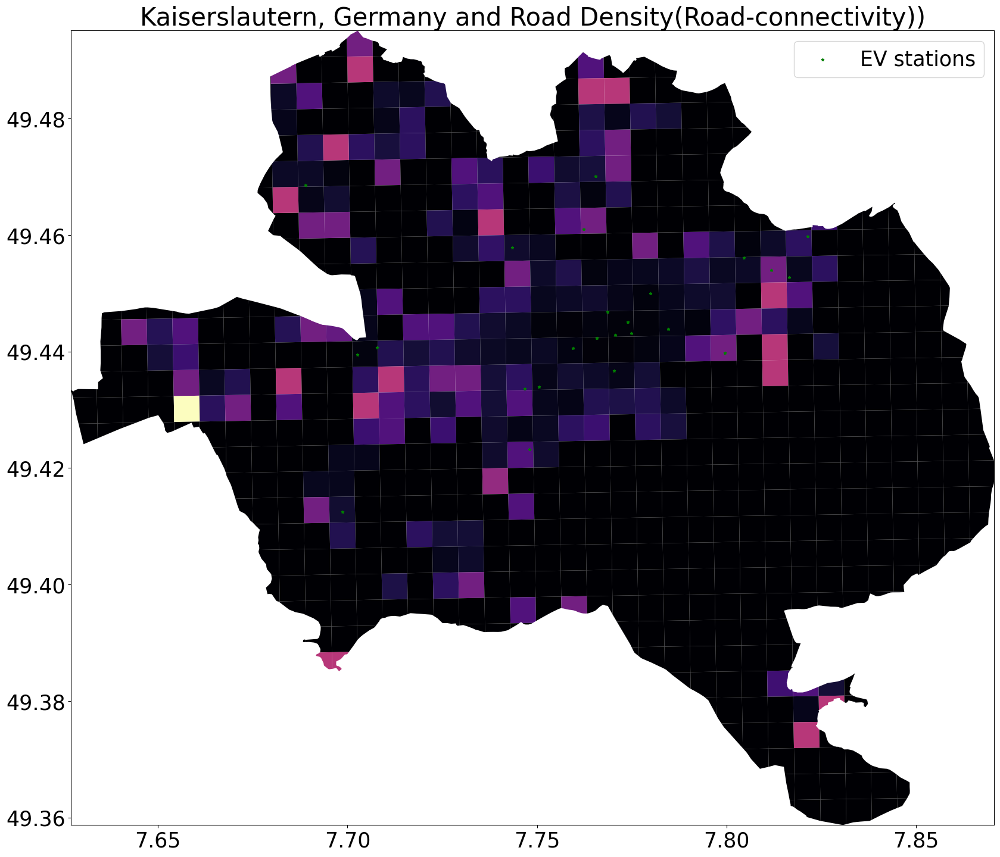

In [62]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'density', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Road Density(Road-connectivity))')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

##### Parking

In [63]:
parking = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "parking"},
)
parking.head()
parking.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-parking.csv")

<Axes: >

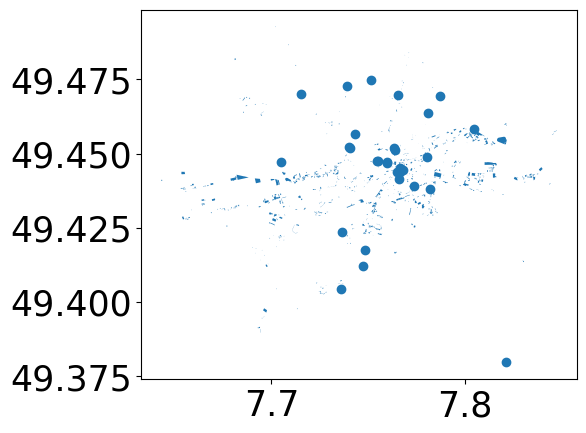

In [64]:
#parking spaces in the city
parking.plot()

In [65]:
#find parking spaces counts in the grid and their types
masks_parking = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = parking.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_parking.append(pip_mask)

100%|██████████| 673/673 [00:00<00:00, 25980.13it/s]


In [66]:
parking[masks_parking[1032]].shape[0]

IndexError: list index out of range

In [67]:
#parking space counts and types to the dataframe
parking_count = []
parking_types = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    parking_count.append(parking[masks_parking[i]].shape[0])
    parking_types.append(parking[masks_parking[i]].parking.value_counts().to_dict())

100%|██████████| 673/673 [00:00<00:00, 805.95it/s]


In [68]:
berlin_polyframe_lat_long_new['parking_count'] = parking_count
berlin_polyframe_lat_long_new['parking_types'] = parking_types

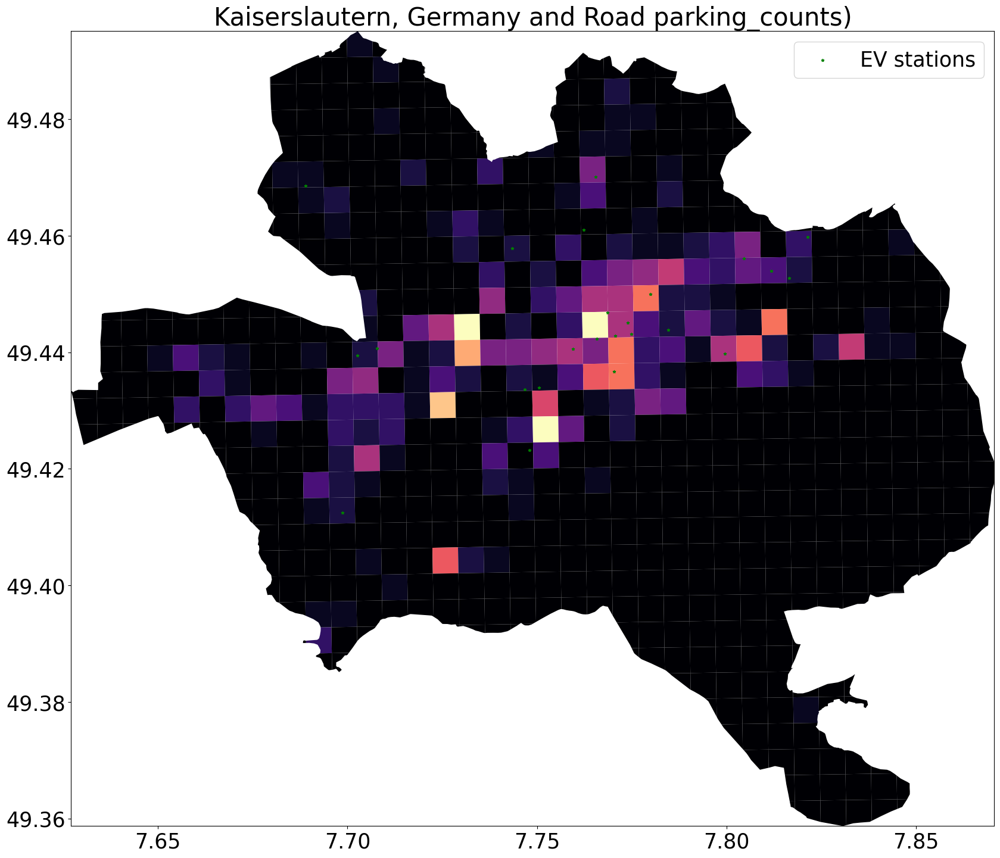

In [69]:
#relation between EV stations and parking spaces

plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'parking_count', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Road parking_counts)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

In [70]:
#realation between EV stations and parking types
berlin_polyframe_lat_long_new[berlin_polyframe_lat_long_new['EV_stations_counts'] != 0].parking_types.value_counts()

#TO DO: PlOT the parking types with EV stations


parking_types
{'surface': 1}                                                           4
{}                                                                       4
{'surface': 2}                                                           3
{'surface': 4}                                                           2
{'surface': 3, 'lane': 1, 'street_side': 1}                              1
{'surface': 3}                                                           1
{'multi-storey': 4, 'surface': 3, 'underground': 1, 'street_side': 1}    1
{'street_side': 1, 'multi-storey': 1, 'surface': 1}                      1
{'surface': 2, 'multi-storey': 1, 'underground': 1, 'street_side': 1}    1
{'surface': 10, 'multi-storey': 2}                                       1
{'surface': 6, 'street_side': 3}                                         1
{'surface': 6}                                                           1
Name: count, dtype: int64

##### Resturants

In [71]:
restaurant = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "restaurant"},
)
restaurant.head()
restaurant.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-restaurant.csv")

<Axes: >

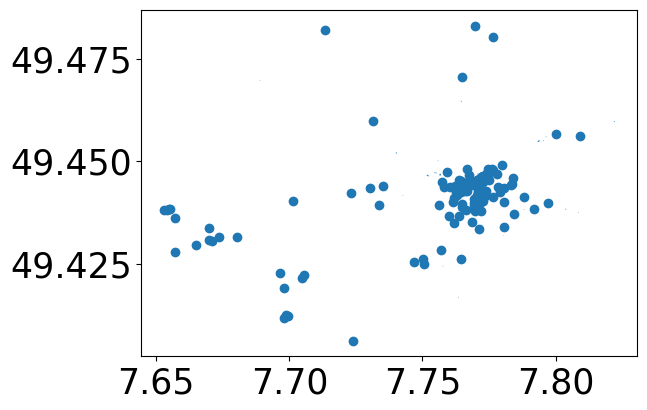

In [72]:
restaurant.plot()

In [73]:
list(restaurant.columns)

['amenity',
 'name',
 'geometry',
 'cuisine',
 'delivery',
 'email',
 'opening_hours',
 'phone',
 'takeaway',
 'website',
 'addr:postcode',
 'indoor_seating',
 'outdoor_seating',
 'wheelchair',
 'level',
 'addr:housenumber',
 'addr:street',
 'alt_name',
 'toilets:wheelchair',
 'diet:vegan',
 'diet:vegetarian',
 'operator',
 'addr:city',
 'fast_food',
 'addr:country',
 'brewery',
 'smoking',
 'air_conditioning',
 'payment:credit_cards',
 'payment:debit_cards',
 'tourism',
 'check_date:opening_hours',
 'opening_hours:delivery',
 'capacity',
 'currency:EUR',
 'currency:USD',
 'wheelchair:description',
 'bar',
 'microbrewery',
 'source',
 'biergarten',
 'contact:facebook',
 'brand',
 'brand:wikidata',
 'brand:wikipedia',
 'currency:XBT',
 'payment:lightning',
 'payment:lightning_contactless',
 'payment:onchain',
 'survey:date',
 'official_name',
 'contact:phone',
 'description',
 'nodes',
 'building',
 'wikidata',
 'wikipedia',
 'building:levels',
 'fax',
 'roof:levels',
 'diet:halal',
 'w

In [74]:
#find resturants counts in the grid and their types
masks_restaurant = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = restaurant.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_restaurant.append(pip_mask)



100%|██████████| 673/673 [00:00<00:00, 43313.23it/s]


In [75]:
#resturant counts and capacity to the dataframe
restaurant_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    restaurant_count.append(restaurant[masks_restaurant[i]].shape[0])

100%|██████████| 673/673 [00:00<00:00, 1704.96it/s]


In [76]:
berlin_polyframe_lat_long_new['restaurant_count'] = restaurant_count

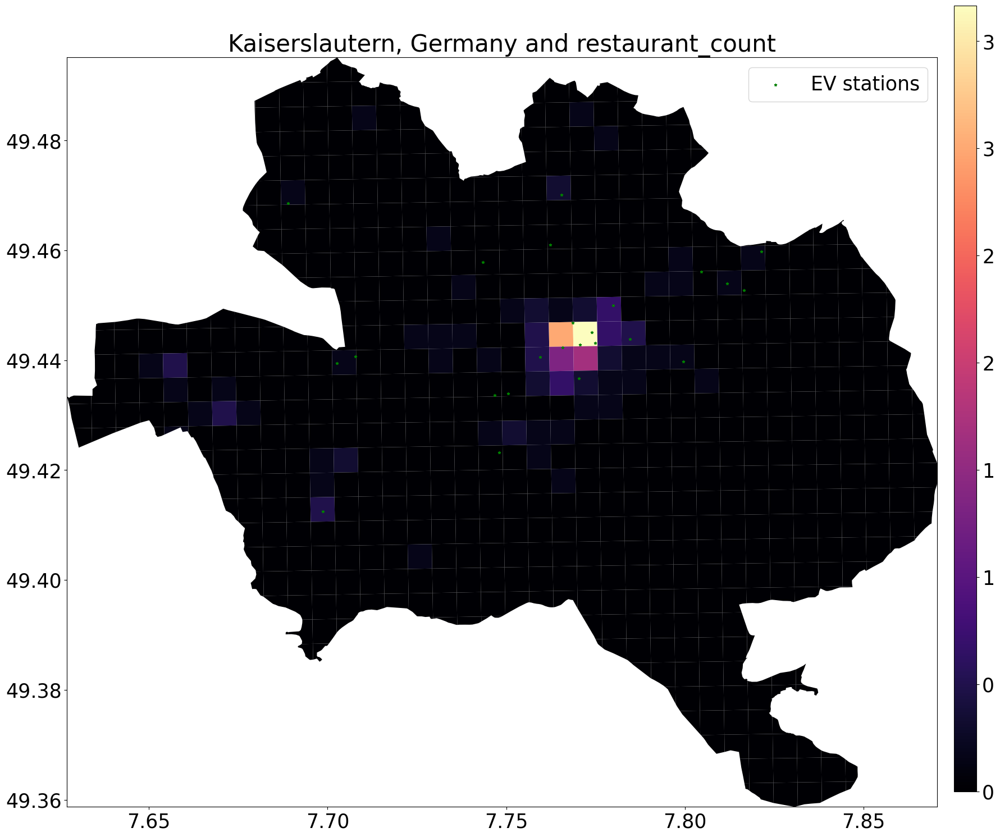

In [77]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'restaurant_count', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['EV stations'])
plt.title(f'{PLACE_NAME} and restaurant_count')
cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(berlin_polyframe_lat_long_new.population), vmax=max(berlin_polyframe_lat_long_new.population)))
sm._A = []
# draw colormap into cbax
fig.colorbar(sm, cax=cbax, format="%d")
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### library

In [78]:
#relation between EV stations and library
library = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "library"},
)
library.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-library.csv")
library.head()

amenity wheelchair                  geometry  \
element_type osmid                                                      
node         805361159   library         no  POINT (7.69794 49.41152)   
             1764481728  library        NaN  POINT (7.75347 49.42456)   
             1764481729  library        yes  POINT (7.75211 49.42491)   
             1848102206  library        NaN  POINT (7.75485 49.42528)   
             2367476122  library         no  POINT (7.77016 49.48046)   

                        air_conditioning        contact:email  \
element_type osmid                                              
node         805361159               NaN                  NaN   
             1764481728               no  infbib@ub.uni-kl.de   
             1764481729               no    info@ub.uni-kl.de   
             1848102206              NaN  eitbib@ub.uni-kl.de   
             2367476122              NaN                  NaN   

                              contact:fax     contact:phone  \
element_type osmid                                            
node         805361159                NaN               NaN   
             1764481728  +49 631 205 2194  +49 631 205 2807   
             1764481729  +49 631 205 2355  +49 631 205 3856   
             1848102206               NaN  +49 631 205-2349   
             2367476122               NaN               NaN   

                                                           contact:website  \
element_type osmid                                                           
node         805361159                                                 NaN   
             1764481728  http://www.ub.uni-kl.de/bereichsbibliotheken/i...   
             1764481729                            http://www.ub.uni-kl.de   
             1848102206  http://www.ub.uni-kl.de/bereichsbibliotheken/e...   
             2367476122                                                NaN   

                        internet_access  \
element_type osmid                        
node         805361159              NaN   
             1764481728            wlan   
             1764481729            wlan   
             1848102206             NaN   
             2367476122             NaN   

                                                                      name  \
element_type osmid                                                           
node         805361159                                                 NaN   
             1764481728                      Bereichsbibliothek Informatik   
             1764481729                                  Zentralbibliothek   
             1848102206  Bereichsbibliothek Elektrotechnik und Informat...   
             2367476122  Stadtbibliothek Kaiserslautern - Stadtteilbüch...   

                         ... toilets:wheelchair addr:floor nodes addr:city  \
element_type osmid       ...                                                 
node         805361159   ...                NaN        NaN   NaN       NaN   
             1764481728  ...                NaN        NaN   NaN       NaN   
             1764481729  ...                NaN        NaN   NaN       NaN   
             1848102206  ...                NaN        NaN   NaN       NaN   
             2367476122  ...                NaN        NaN   NaN       NaN   

                        addr:housenumber addr:postcode addr:street building  \
element_type osmid                                                            
node         805361159               NaN           NaN         NaN      NaN   
             1764481728              NaN           NaN         NaN      NaN   
             1764481729              NaN           NaN         NaN      NaN   
             1848102206              NaN           NaN         NaN      NaN   
             2367476122              NaN           NaN         NaN      NaN   

                        addr:country website  
element_type osmid                            
node         805361159  

<Axes: >

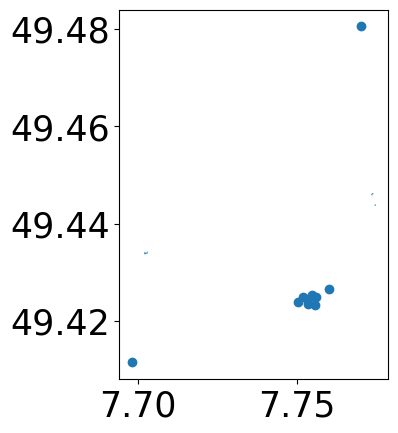

In [79]:
library.plot()

In [80]:
list(library.columns)

['amenity',
 'wheelchair',
 'geometry',
 'air_conditioning',
 'contact:email',
 'contact:fax',
 'contact:phone',
 'contact:website',
 'internet_access',
 'name',
 'opening_hours',
 'operator',
 'ref:isil',
 'wikidata',
 'level',
 'short_name',
 'description',
 'wheelchair:description',
 'toilets:wheelchair',
 'addr:floor',
 'nodes',
 'addr:city',
 'addr:housenumber',
 'addr:postcode',
 'addr:street',
 'building',
 'addr:country',
 'website']

In [81]:
# find library counts in the grid
masks_library = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = library.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_library.append(pip_mask)

#library counts to the dataframe
library_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    library_count.append(library[masks_library[i]].shape[0])

berlin_polyframe_lat_long_new['library_count'] = library_count

100%|██████████| 673/673 [00:00<00:00, 1855.41it/s]


##### University

In [82]:
university = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "university"},
)
university.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-university.csv")
university.head()

geometry  \
element_type osmid                                                           
node         6458692386                           POINT (7.75002 49.42401)   
way          27881569    POLYGON ((7.76264 49.45005, 7.76311 49.45006, ...   
             44491292    POLYGON ((7.74951 49.42229, 7.74962 49.42334, ...   
             973445391   POLYGON ((7.75779 49.44763, 7.75773 49.44699, ...   

                              addr:city addr:housenumber addr:postcode  \
element_type osmid                                                       
node         6458692386  Kaiserslautern               42         67663   
way          27881569    Kaiserslautern               31         67657   
             44491292               NaN              NaN           NaN   
             973445391   Kaiserslautern              NaN         67659   

                                     addr:street     amenity  \
element_type osmid                                             
node         6458692386  Gottlieb-Daimler-Straße  university   
way          27881569         Morlauterer Straße  university   
             44491292                        NaN  university   
             973445391              Schoenstraße  university   

                                                               description  \
element_type osmid                                                           
node         6458692386  Mit 17 wirtschaftlichen Lehrgebieten bietet de...   
way          27881569                                                  NaN   
             44491292                                                  NaN   
             973445391                                                 NaN   

                        internet_access  \
element_type osmid                        
node         6458692386            wlan   
way          27881569               NaN   
             44491292              wlan   
             973445391              NaN   

                                                                      name  \
element_type osmid                                                           
node         6458692386              Fachbereich Wirtschaftswissenschaften   
way          27881569    Hochschule Kaiserslautern, Standort Morlautere...   
             44491292    Technische Universität Kaiserslautern Rheinlan...   
             973445391          Hochschule Kaiserslautern, Campus Kammgarn   

                                  operator                  website  \
element_type osmid                                                    
node         6458692386  TU Kaiserslautern  https://wiwi.uni-kl.de/   
way          27881569                  NaN                      NaN   
             44491292                  NaN          https://rptu.de   
             973445391                 NaN     https://www.hs-kl.de   

                                                                     nodes  \
element_type osmid                                                           
node         6458692386                                                NaN   
way          27881569    [270693106, 1290176452, 1290175957, 338997204,...   
             44491292    [565345767, 565345768, 565345769, 3990359849, ...   
             973445391   [307426545, 339014607, 6691243332, 6691243334,...   

                        wheelchair internet_access:ssid wikidata  \
element_type osmid                                                 
node         6458692386        NaN                  NaN      NaN   
way          27881569          yes                  NaN      NaN   
             44491292      limited              eduroam  Q678965   
             973445391         NaN                  NaN      NaN   

                                                        wikipedia  \
element_type osmid                                                  
node         6458692386                                       NaN   
way          27881569                                     

<Axes: >

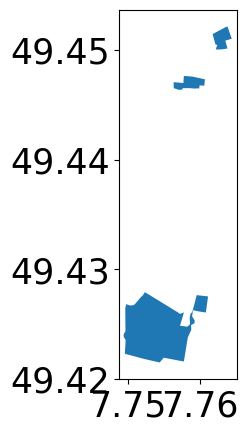

In [83]:
university.plot()

In [84]:
# find university counts in the grid
masks_university = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = university.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_university.append(pip_mask)

#university counts to the dataframe
university_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    university_count.append(university[masks_university[i]].shape[0])

berlin_polyframe_lat_long_new['university_count'] = university_count


100%|██████████| 673/673 [00:00<00:00, 1908.51it/s]


##### School

In [85]:
school = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "school"},
)
school.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-school.csv")
school.head()

barrier  \
element_type osmid                 
node         6807593601      NaN   
             6808451077      NaN   
             10689392012     NaN   
way          30657225        NaN   
             103144845       NaN   

                                                                   geometry  \
element_type osmid                                                            
node         6807593601                            POINT (7.80287 49.45768)   
             6808451077                            POINT (7.68946 49.46665)   
             10689392012                           POINT (7.77298 49.44737)   
way          30657225     POLYGON ((7.76536 49.47071, 7.76530 49.47070, ...   
             103144845    POLYGON ((7.76342 49.44140, 7.76345 49.44141, ...   

                         amenity                            name  \
element_type osmid                                                 
node         6807593601   school  Prof. König und Leiser Schulen   
             6808451077   school            Paul-Gerhardt-Schule   
             10689392012  school       IQ+ Privates Lehrinstitut   
way          30657225     school          Grundschule Morlautern   
             103144845    school                      Röhmschule   

                                                        website wheelchair  \
element_type osmid                                                           
node         6807593601       http://www.koenigleiserschulen.de        yes   
             6808451077                    http://www.pgs-kl.de        NaN   
             10689392012       https://www.nachhilfe-iqplus.de/        NaN   
way          30657225                                       NaN        NaN   
             103144845    http://www.schulen-kl.de/roehmschule/         no   

                               addr:city addr:housenumber addr:postcode  \
element_type osmid                                                        
node         6807593601              NaN              NaN           NaN   
             6808451077   Kaiserslautern               14         67661   
             10689392012             NaN              NaN           NaN   
way          30657225     Kaiserslautern               44         67659   
             103144845               NaN              NaN           NaN   

                                 addr:street  ... landuse addr:country  \
element_type osmid                            ...                        
node         6807593601                  NaN  ...     NaN          NaN   
             6808451077         Finkenstraße  ...     NaN          NaN   
             10689392012                 NaN  ...     NaN          NaN   
way          30657225     Otterberger Straße  ...     NaN          NaN   
             103144845                   NaN  ...     NaN          NaN   

                         building contact:website isced:level addr:suburb  \
element_type osmid                                                          
node         6807593601       NaN             NaN         NaN         NaN   
             6808451077       NaN             NaN         NaN         NaN   
             10689392012      NaN             NaN         NaN         NaN   
way          30657225         NaN             NaN         NaN         NaN   
             103144845        NaN             NaN         NaN         NaN   

                         email grades ways type  
element_type osmid                               
node         6807593601    NaN    NaN  NaN  NaN  
             6808451077    NaN    NaN  NaN  NaN  
             10689392012   NaN    NaN  NaN  NaN  
way          30657225      NaN    NaN  NaN  NaN  
             103144845     NaN    NaN  NaN  NaN  

[5 rows x 39 columns]

<Axes: >

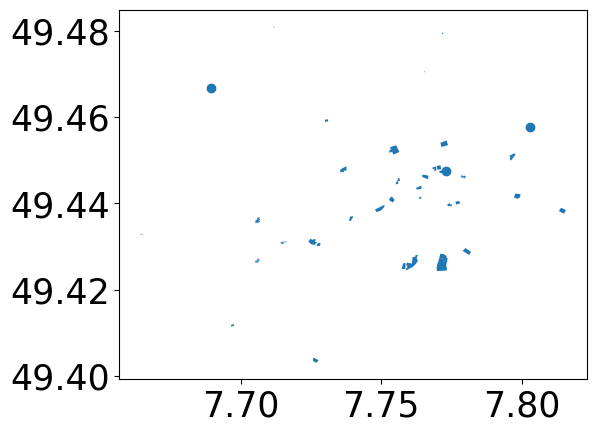

In [86]:
school.plot()

In [87]:
# find school counts in the grid
masks_school = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = school.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_school.append(pip_mask)

#school counts to the dataframe
school_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    school_count.append(school[masks_school[i]].shape[0])

berlin_polyframe_lat_long_new['school_count'] = school_count


100%|██████████| 673/673 [00:00<00:00, 1877.78it/s]


##### Leisure = park

In [88]:
park = ox.geometries_from_place(
    PLACE_NAME,
    {"leisure": "park"},
)

park.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-park.csv")
park.head()


name  \
element_type osmid                          
way          23610714  Japanischer Garten   
             24477914           Volkspark   
             26644409      Davenportplatz   
             30654967    Jean-Schoen-Park   
             30678026                 NaN   

                                                                geometry  \
element_type osmid                                                         
way          23610714  POLYGON ((7.76349 49.44750, 7.76361 49.44750, ...   
             24477914  POLYGON ((7.78907 49.44110, 7.78924 49.44130, ...   
             26644409  POLYGON ((7.74772 49.42534, 7.74796 49.42530, ...   
             30654967  POLYGON ((7.75659 49.44775, 7.75779 49.44770, ...   
             30678026  POLYGON ((7.77241 49.44551, 7.77255 49.44553, ...   

                      barrier bicycle  \
element_type osmid                      
way          23610714    wall     NaN   
             24477914     NaN     NaN   
             26644409     NaN     NaN   
             30654967     NaN     NaN   
             30678026     NaN     NaN   

                                                                   nodes  fee  \
element_type osmid                                                              
way          23610714  [255717931, 1237125071, 5110264064, 255717930,...  yes   
             24477914  [365505538, 2181903175, 1215823656, 2181903196...  NaN   
             26644409  [292254129, 292254130, 292254133, 292254135, 2...  NaN   
             30654967  [339014602, 339014605, 307426545, 307426548, 3...  NaN   
             30678026  [339258241, 1829577759, 338971061, 1829577761,...  NaN   

                      leisure  \
element_type osmid              
way          23610714    park   
             24477914    park   
             26644409    park   
             30654967    park   
             30678026    park   

                                                           opening_hours  \
element_type osmid                                                         
way          23610714  Apr,Oct: Tu-Su 10:00-18:00; May-Sep Tu-Su 10:0...   
             24477914                                                NaN   
             26644409                                                NaN   
             30654967                                                NaN   
             30678026                                                NaN   

                                               website  wikidata  ...  \
element_type osmid                                                ...   
way          23610714  http://www.japanischergarten.de   Q876793  ...   
             24477914                              NaN  Q2532114  ...   
             26644409                              NaN       NaN  ...   
             30654967                              NaN       NaN  ...   
             30678026                              NaN       NaN  ...   

                      wikipedia source name:etymology:wikidata addr:city  \
element_type osmid                                                         
way          23610714       NaN    NaN                     NaN       NaN   
             24477914       NaN    NaN                     NaN       NaN   
             26644409       NaN    NaN                     NaN       NaN   
             30654967       NaN    NaN                     NaN       NaN   
             30678026       NaN    NaN                     NaN       NaN   

                      addr:postcode addr:street operator operator:type ways  \
element_type osmid                                                            
way          23610714           NaN         NaN      NaN           NaN  NaN   
             24477914           NaN         NaN      NaN           NaN  NaN   
             26644409           NaN         NaN      NaN           NaN  NaN   
             30654967           NaN         NaN      NaN           NaN  NaN   
             30678026           NaN         NaN 

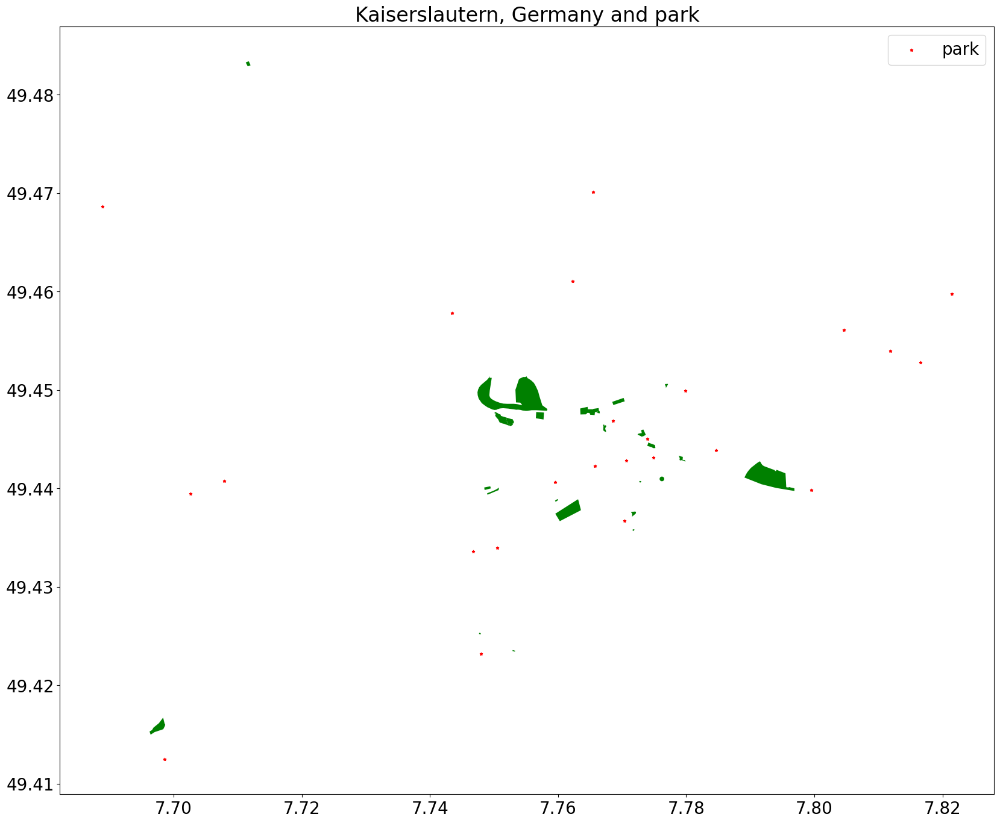

In [89]:
#plot the park data 

plt.rcParams.update({'font.size':20})
fig, ax = plt.subplots(figsize=(20,20))
park.plot(ax=ax, legend=False, color='green')
plt.title(f'{PLACE_NAME} and park')

# add EV stations
EV_stations.plot(ax=ax, color='red', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['park', 'EV stations'])

In [90]:
# find park counts in the grid
masks_park = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = park.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_park.append(pip_mask)

#park counts to the dataframe
park_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    park_count.append(park[masks_park[i]].shape[0])

berlin_polyframe_lat_long_new['park_count'] = park_count

100%|██████████| 673/673 [00:00<00:00, 1792.38it/s]


##### Leisure = Cinema

In [91]:
cinema = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "cinema"},
)
cinema.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-cinema.csv")
cinema.head()

geometry  \
element_type osmid                                                         
way          96050387  POLYGON ((7.77085 49.44364, 7.77112 49.44371, ...   
             96936612  POLYGON ((7.76793 49.44225, 7.76793 49.44219, ...   
             97869430  POLYGON ((7.80138 49.45686, 7.80116 49.45678, ...   

                                                                   nodes  \
element_type osmid                                                         
way          96050387  [6282835800, 1112875829, 1112875488, 387482683...   
             96936612  [1123353729, 4550569904, 1123353824, 435635298...   
             97869430  [1132762528, 1132762567, 1132763594, 113276339...   

                            addr:city addr:housenumber addr:postcode  \
element_type osmid                                                     
way          96050387  Kaiserslautern                8         67655   
             96936612  Kaiserslautern               24         67655   
             97869430  Kaiserslautern                8         67657   

                             addr:street amenity building cinema:3D  \
element_type osmid                                                    
way          96050387        Münchstraße  cinema      yes       yes   
             96936612        Kerststraße  cinema      yes       NaN   
             97869430  Straßburger Allee  cinema      yes       NaN   

                                              name  ...  \
element_type osmid                                  ...   
way          96050387           Central Filmpalast  ...   
             96936612                Union-Theater  ...   
             97869430  UCI Kinowelt Kaiserslautern  ...   

                                                                 website  \
element_type osmid                                                         
way          96050387                https://www.central-citycinemas.com   
             96936612                            http://www.union-kl.de/   
             97869430  https://www.uci-kinowelt.de/kinoprogramm/kaise...   

                      wheelchair  wikidata                         wikipedia  \
element_type osmid                                                             
way          96050387         no  Q1053665  de:Central-Kino (Kaiserslautern)   
             96936612         no  Q1657960                  de:Union-Theater   
             97869430        yes       NaN                               NaN   

                      addr:country         brand brand:wikidata  \
element_type osmid                                                
way          96050387          NaN           NaN            NaN   
             96936612           DE           NaN            NaN   
             97869430           DE  UCI Kinowelt        Q521922   

                                       brand:wikipedia            phone  \
element_type osmid                                                        
way          96050387                              NaN              NaN   
             96936612                              NaN              NaN   
             97869430  de:United Cinemas International  +49 631 4151515   

                      short_name  
element_type osmid                
way          96050387        NaN  
             96936612        NaN  
             97869430        UCI  

[3 rows x 23 columns]

<Axes: >

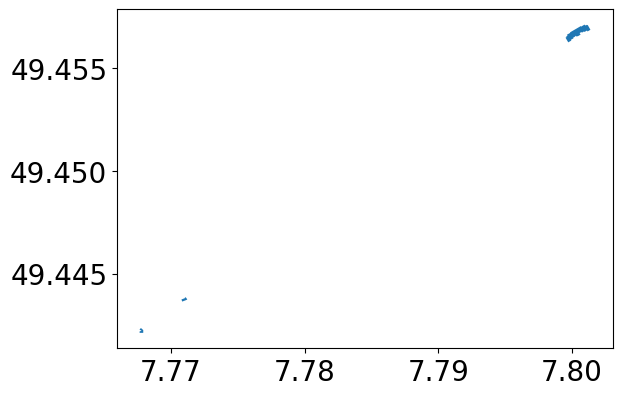

In [92]:
cinema.plot()

In [93]:
# find cinema counts in the grid
masks_cinema = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = cinema.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_cinema.append(pip_mask)

#cinema counts to the dataframe
cinema_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    cinema_count.append(cinema[masks_cinema[i]].shape[0])

100%|██████████| 673/673 [00:00<00:00, 1861.70it/s]


##### Townhall

In [94]:
townhall = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "townhall"},
)
townhall.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-townhall.csv")
townhall.head()

amenity wheelchair  \
element_type osmid                             
node         463184037   townhall    limited   
             1574839176  townhall        NaN   
             2367475935  townhall         no   
way          88513697    townhall        NaN   
             93806300    townhall        yes   

                                                                  geometry  \
element_type osmid                                                           
node         463184037                            POINT (7.82157 49.37975)   
             1574839176                           POINT (7.68932 49.46635)   
             2367475935                           POINT (7.77018 49.48042)   
way          88513697    POLYGON ((7.76502 49.46810, 7.76487 49.46812, ...   
             93806300    POLYGON ((7.76658 49.44714, 7.76665 49.44677, ...   

                        addr:housenumber addr:postcode         addr:street  \
element_type osmid                                                           
node         463184037               NaN           NaN                 NaN   
             1574839176               14         67661        Finkenstraße   
             2367475935              NaN           NaN                 NaN   
way          88513697                 22         67659  Otterberger Straße   
             93806300                 19         67659           Maxstraße   

                                                                  name  \
element_type osmid                                                       
node         463184037                                             NaN   
             1574839176                                 Ortsverwaltung   
             2367475935  Stadt Kaiserslautern Ortsverwaltung Erlenbach   
way          88513697                               Rathaus Morlautern   
             93806300                                     Rathaus West   

                          opening_hours  \
element_type osmid                        
node         463184037              NaN   
             1574839176             NaN   
             2367475935  Tu 16:30-17:30   
way          88513697               NaN   
             93806300               NaN   

                                        wheelchair:description  \
element_type osmid                                               
node         463184037                                     NaN   
             1574839176                                    NaN   
             2367475935  Eingang nur über Treppen zu erreichen   
way          88513697                                      NaN   
             93806300                                      NaN   

                                                                     nodes  \
element_type osmid                                                           
node         463184037                                                 NaN   
             1574839176                                                NaN   
             2367475935                                                NaN   
way          88513697    [1096232518, 1028045442, 1028047043, 102804633...   
             93806300    [1089601760, 1089601589, 1089601696, 108960140...   

                         ... roof:levels roof:shape addr:country website  \
element_type osmid       ...                                               
node         463184037   ...         NaN        NaN          NaN     NaN   
             1574839176  ...         NaN        NaN          NaN     NaN   
             2367475935  ...         NaN        NaN          NaN     NaN   
way          88513697    ...           1     hipped          NaN     NaN   
             93806300    ...         NaN        NaN           DE     NaN   

                        building:parts  fax phone roof:material townhall:type  \
element_type osmid                                                              
node         463184037             NaN  NaN   NaN           NaN      

<Axes: >

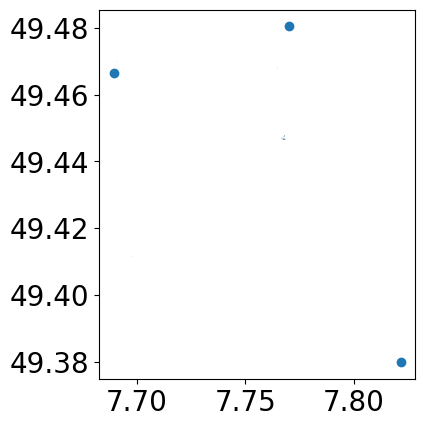

In [95]:
townhall.plot()

In [96]:
# find townhall counts in the grid
masks_townhall = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = townhall.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_townhall.append(pip_mask)

#townhall counts to the dataframe
townhall_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    townhall_count.append(townhall[masks_townhall[i]].shape[0])

berlin_polyframe_lat_long_new['townhall_count'] = townhall_count


100%|██████████| 673/673 [00:00<00:00, 1872.20it/s]


##### Community_centre

In [97]:
Community_centre = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "community_centre"},
)
Community_centre.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-Community_centre.csv")
Community_centre.head()

amenity internet_access  \
element_type osmid                                           
node         2337403160   community_centre            wlan   
             9009805171   community_centre             NaN   
             10795269858  community_centre             NaN   
way          25092200     community_centre             NaN   
             95796120     community_centre             NaN   

                                           name  \
element_type osmid                                
node         2337403160                Eselsohr   
             9009805171   BDKJ Region Nordpfalz   
             10795269858           Stiftskeller   
way          25092200          Theo-Barth-Halle   
             95796120          Edith-Stein-Haus   

                                               opening_hours  \
element_type osmid                                             
node         2337403160   "Siehe Webseite/nach Vereinbarung"   
             9009805171                                 24/7   
             10795269858                                 NaN   
way          25092200                                    NaN   
             95796120                                    NaN   

                                                           operator  \
element_type osmid                                                    
node         2337403160            Kulturverein Musikerviertel e.V.   
             9009805171   Katholische Jugendzentrale Kaiserslautern   
             10795269858                                        NaN   
way          25092200                                           NaN   
             95796120                                           NaN   

                                       website wheelchair  \
element_type osmid                                          
node         2337403160   https://eselsohr.org         no   
             9009805171                    NaN        NaN   
             10795269858                   NaN        NaN   
way          25092200                      NaN        NaN   
             95796120                      NaN        NaN   

                                                                   geometry  \
element_type osmid                                                            
node         2337403160                            POINT (7.76741 49.43907)   
             9009805171                            POINT (7.77306 49.44600)   
             10795269858                           POINT (7.77369 49.44472)   
way          25092200     POLYGON ((7.77819 49.48055, 7.77797 49.48019, ...   
             95796120     POLYGON ((7.77295 49.44611, 7.77291 49.44620, ...   

                               addr:city addr:housenumber  ... building  \
element_type osmid                                         ...            
node         2337403160              NaN              NaN  ...      NaN   
             9009805171   Kaiserslautern                6  ...      NaN   
             10795269858             NaN              NaN  ...      NaN   
way          25092200                NaN              NaN  ...      yes   
             95796120     Kaiserslautern                1  ...      yes   

                         addr:country community_centre:for min_age short_name  \
element_type osmid                                                              
node         2337403160           NaN                  NaN     NaN        NaN   
             9009805171           NaN                  NaN     NaN        NaN   
             10795269858          NaN                  NaN     NaN        NaN   
way          25092200             NaN                  NaN     NaN        NaN   
             95796120              DE                  NaN     NaN        NaN   

                         start_date phone toilets:wheelchair  \
element_type osmid                                             
node         2337403160         NaN   NaN                NaN   
             9009805171    

In [98]:
# find Community_centre counts in the grid
masks_Community_centre = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = Community_centre.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_Community_centre.append(pip_mask)

#Community_centre counts to the dataframe
Community_centre_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    Community_centre_count.append(Community_centre[masks_Community_centre[i]].shape[0])

100%|██████████| 673/673 [00:00<00:00, 1894.19it/s]


In [99]:
berlin_polyframe_lat_long_new['Community_centre_count'] = Community_centre_count

##### Building = Geovenment 

In [102]:
# government = ox.geometries_from_place(
#     PLACE_NAME,
#     {"building": "government"},
# )

# government.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-government_building.csv")
# government.head()

<Axes: >

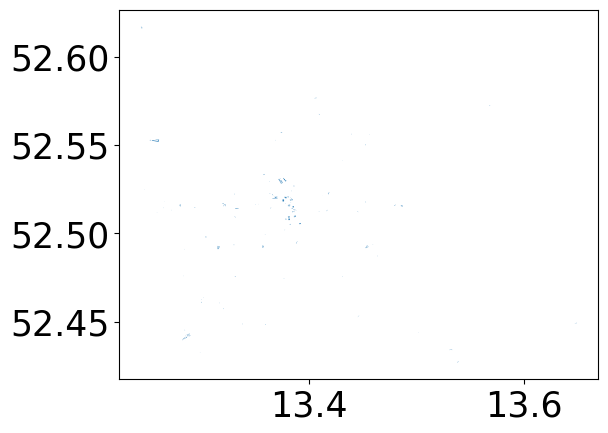

In [ ]:
government.plot()

In [ ]:
# find government counts in the grid
masks_government = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = government.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_government.append(pip_mask)

#government counts to the dataframe
government_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    government_count.append(government[masks_government[i]].shape[0])

berlin_polyframe_lat_long_new['government_count'] = government_count


100%|██████████| 3891/3891 [00:02<00:00, 1631.44it/s]


##### Building=civic 

In [ ]:
civic = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "civic"},
)

civic.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-civic_building.csv")
civic.head()

geometry  \
element_type osmid                                                         
way          5083117   POLYGON ((13.20134 52.53602, 13.20142 52.53603...   
             7997184   POLYGON ((13.45165 52.53020, 13.45153 52.53016...   
             7997192   POLYGON ((13.45363 52.52893, 13.45258 52.52854...   
             11687794  POLYGON ((13.34779 52.50112, 13.34797 52.50144...   
             12089675  POLYGON ((13.31547 52.57978, 13.31641 52.57948...   

                      addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                            
way          5083117        NaN          NaN              NaN           NaN   
             7997184        NaN          NaN              NaN           NaN   
             7997192     Berlin           DE               26         10407   
             11687794    Berlin          NaN               17         10787   
             12089675    Berlin          NaN          115-121         13403   

                             addr:street      addr:suburb wheelchair access  \
element_type osmid                                                            
way          5083117                 NaN              NaN        NaN    NaN   
             7997184                 NaN              NaN        yes    NaN   
             7997192   Paul-Heyse-Straße  Prenzlauer Berg        yes    NaN   
             11687794      An der Urania              NaN        yes    NaN   
             12089675       Eichborndamm      Borsigwalde        NaN    NaN   

                                               source  ... name:it  \
element_type osmid                                     ...           
way          5083117   Geoportal Berlin / Hausumringe  ...     NaN   
             7997184                              NaN  ...     NaN   
             7997192                              NaN  ...     NaN   
             11687794                             NaN  ...     NaN   
             12089675                             NaN  ...     NaN   

                      description:de ways type official_name not:historic  \
element_type osmid                                                          
way          5083117             NaN  NaN  NaN           NaN          NaN   
             7997184             NaN  NaN  NaN           NaN          NaN   
             7997192             NaN  NaN  NaN           NaN          NaN   
             11687794            NaN  NaN  NaN           NaN          NaN   
             12089675            NaN  NaN  NaN           NaN          NaN   

                      not:name blind:description:de name:prefix townhall:type  
element_type osmid                                                             
way          5083117       NaN                  NaN         NaN           NaN  
             7997184       NaN                  NaN         NaN           NaN  
             7997192       NaN                  NaN         NaN           NaN  
             11687794      NaN                  NaN         NaN           NaN  
             12089675      NaN                  NaN         NaN           NaN  

[5 rows x 139 columns]

<Axes: >

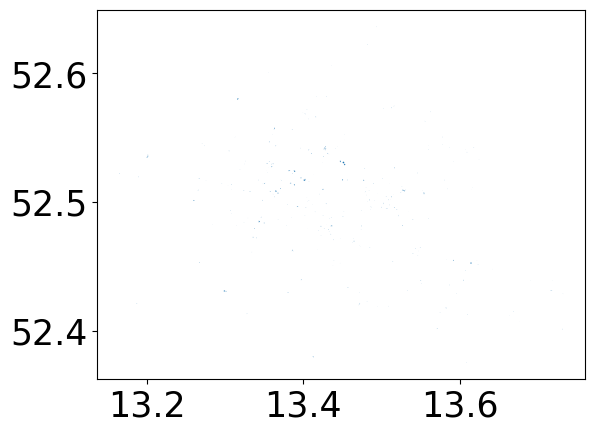

In [ ]:
civic.plot()

In [ ]:
# find civic counts in the grid
masks_civic = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = civic.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_civic.append(pip_mask)

#civic counts to the dataframe
civic_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    civic_count.append(civic[masks_civic[i]].shape[0])

berlin_polyframe_lat_long_new['civic_count'] = civic_count

100%|██████████| 3891/3891 [00:02<00:00, 1580.10it/s]


##### building=commercial

In [ ]:
commercial = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "commercial"},
)
commercial.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-commercial_building.csv")
commercial.head()


amenity brand brand:wikidata brand:wikipedia  \
element_type osmid                                                       
node         10539765825      NaN   NaN            NaN             NaN   
             10539796071      NaN   NaN            NaN             NaN   
             10723725005      NaN   NaN            NaN             NaN   
way          9857234          NaN   NaN            NaN             NaN   
             9857259      parking   NaN            NaN             NaN   

                         opening_hours wheelchair  \
element_type osmid                                  
node         10539765825           NaN        NaN   
             10539796071           NaN        NaN   
             10723725005           NaN        NaN   
way          9857234               NaN        NaN   
             9857259               NaN        NaN   

                                                                   geometry  \
element_type osmid                                                            
node         10539765825                          POINT (13.41350 52.53856)   
             10539796071                          POINT (13.41420 52.53888)   
             10723725005                          POINT (13.38496 52.47117)   
way          9857234      POLYGON ((13.29814 52.57965, 13.29737 52.57920...   
             9857259      POLYGON ((13.29493 52.57967, 13.29528 52.57924...   

                         addr:city addr:country addr:housenumber  ...  \
element_type osmid                                                ...   
node         10539765825       NaN          NaN              NaN  ...   
             10539796071       NaN          NaN              NaN  ...   
             10723725005       NaN          NaN              NaN  ...   
way          9857234        Berlin           DE              NaN  ...   
             9857259           NaN          NaN              NaN  ...   

                         source:toilets:wheelchair heritage:since roof trade  \
element_type osmid                                                             
node         10539765825                       NaN            NaN  NaN   NaN   
             10539796071                       NaN            NaN  NaN   NaN   
             10723725005                       NaN            NaN  NaN   NaN   
way          9857234                           NaN            NaN  NaN   NaN   
             9857259                           NaN            NaN  NaN   NaN   

                         type ways building:roof:shape building:parts  \
element_type osmid                                                      
node         10539765825  NaN  NaN                 NaN            NaN   
             10539796071  NaN  NaN                 NaN            NaN   
             10723725005  NaN  NaN                 NaN            NaN   
way          9857234      NaN  NaN                 NaN            NaN   
             9857259      NaN  NaN                 NaN            NaN   

                         loc_name construction:office  
element_type osmid                                     
node         10539765825      NaN                 NaN  
             10539796071      NaN                 NaN  
             10723725005      NaN                 NaN  
way          9857234          NaN                 NaN  
             9857259          NaN                 NaN  

[5 rows x 296 columns]

<Axes: >

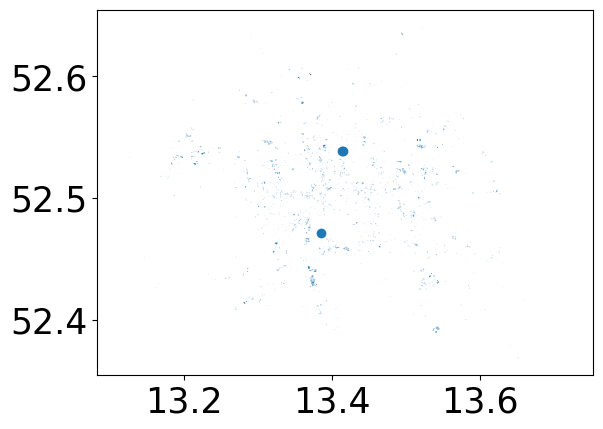

In [ ]:
commercial.plot()

In [ ]:
# find commercial counts in the grid
masks_commercial = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = commercial.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_commercial.append(pip_mask)

#commercial counts to the dataframe
commercial_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    commercial_count.append(commercial[masks_commercial[i]].shape[0])

berlin_polyframe_lat_long_new['commercial_count'] = commercial_count


100%|██████████| 3891/3891 [00:02<00:00, 1317.95it/s]


##### building = Retail stores

In [ ]:
retail = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "retail"},
)
retail.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-retail_building.csv")
retail.head()

addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                            
way          4703544     Berlin           DE              2-4         10551   
             9857335        NaN          NaN              NaN           NaN   
             10672229    Berlin           DE              NaN         13403   
             11076700    Berlin           DE              140         13405   
             11249452    Berlin           DE                1         13051   

                                  addr:street           addr:suburb source  \
element_type osmid                                                           
way          4703544           Arminiusstraße                Moabit    NaN   
             9857335                      NaN                   NaN    NaN   
             10672229  Auguste-Viktoria-Allee         Reinickendorf    NaN   
             11076700       Scharnweberstraße         Reinickendorf    NaN   
             11249452          Prerower Platz  Neu-Hohenschönhausen    NaN   

                                                                geometry  \
element_type osmid                                                         
way          4703544   POLYGON ((13.33907 52.52743, 13.33903 52.52741...   
             9857335   POLYGON ((13.29313 52.57966, 13.29338 52.57958...   
             10672229  POLYGON ((13.32837 52.57004, 13.32838 52.57007...   
             11076700  POLYGON ((13.32754 52.56323, 13.32756 52.56327...   
             11249452  POLYGON ((13.50654 52.56407, 13.50652 52.56407...   

                      access      amenity  ... sausage  \
element_type osmid                         ...           
way          4703544     NaN  marketplace  ...     NaN   
             9857335     NaN          NaN  ...     NaN   
             10672229    NaN          NaN  ...     NaN   
             11076700    NaN          NaN  ...     NaN   
             11249452    NaN          NaN  ...     NaN   

                      standup_paddleboard_rental ways note:opening_hours  \
element_type osmid                                                         
way          4703544                         NaN  NaN                NaN   
             9857335                         NaN  NaN                NaN   
             10672229                        NaN  NaN                NaN   
             11076700                        NaN  NaN                NaN   
             11249452                        NaN  NaN                NaN   

                      source:opening_hours name:ko name:es name:fr name:nl  \
element_type osmid                                                           
way          4703544                   NaN     NaN     NaN     NaN     NaN   
             9857335                   NaN     NaN     NaN     NaN     NaN   
             10672229                  NaN     NaN     NaN     NaN     NaN   
             11076700                  NaN     NaN     NaN     NaN     NaN   
             11249452                  NaN     NaN     NaN     NaN     NaN   

                      name:tr  
element_type osmid             
way          4703544      NaN  
             9857335      NaN  
             10672229     NaN  
             11076700     NaN  
             11249452     NaN  

[5 rows x 251 columns]

<Axes: >

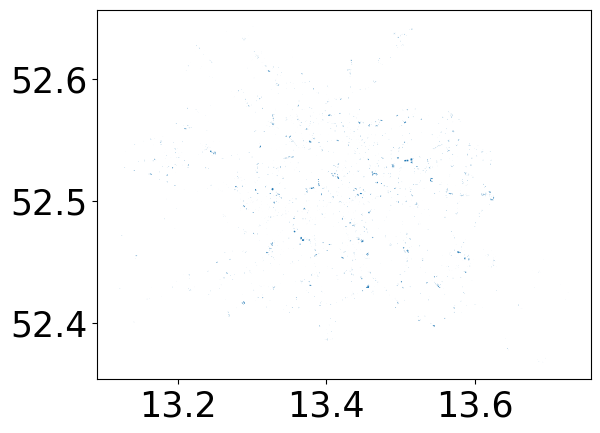

In [ ]:
retail.plot()

In [ ]:
# find retail counts in the grid
masks_retail = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = retail.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_retail.append(pip_mask)

#retail counts to the dataframe
retail_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    retail_count.append(retail[masks_retail[i]].shape[0])

berlin_polyframe_lat_long_new['retail_count'] = retail_count

100%|██████████| 3891/3891 [00:02<00:00, 1407.76it/s]


##### amenity=place_of_worship

In [ ]:
place_of_worship = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "place_of_worship"},
)
place_of_worship.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-place_of_worship.csv")
place_of_worship.head()

amenity  \
element_type osmid                         
node         29040731   place_of_worship   
             29209127   place_of_worship   
             248702772  place_of_worship   
             289795838  place_of_worship   
             292201931  place_of_worship   

                                                         name   religion  \
element_type osmid                                                         
node         29040731                      Sultan Ahmed Camii     muslim   
             29209127                                     NaN  christian   
             248702772                  Martin-Luther-Kapelle  christian   
             289795838                            St. Wilhelm  christian   
             292201931  Stadtmission Gemeinde Friedrichshagen  christian   

                       wheelchair                   geometry denomination  \
element_type osmid                                                          
node         29040731         yes  POINT (13.35878 52.53478)          NaN   
             29209127     limited  POINT (13.39038 52.49518)          NaN   
             248702772        NaN  POINT (13.29662 52.60102)   protestant   
             289795838        NaN  POINT (13.19542 52.52251)     catholic   
             292201931        NaN  POINT (13.62357 52.44750)   protestant   

                       addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                             
node         29040731        NaN          NaN              NaN           NaN   
             29209127        NaN          NaN              NaN           NaN   
             248702772       NaN          NaN              NaN           NaN   
             289795838    Berlin           DE             9-11         13595   
             292201931    Berlin           DE              135         12587   

                        ... name:sr-Latn description:de name:et  \
element_type osmid      ...                                       
node         29040731   ...          NaN            NaN     NaN   
             29209127   ...          NaN            NaN     NaN   
             248702772  ...          NaN            NaN     NaN   
             289795838  ...          NaN            NaN     NaN   
             292201931  ...          NaN            NaN     NaN   

                       reconstruction_date layer location landuse name:signed  \
element_type osmid                                                              
node         29040731                  NaN   NaN      NaN     NaN         NaN   
             29209127                  NaN   NaN      NaN     NaN         NaN   
             248702772                 NaN   NaN      NaN     NaN         NaN   
             289795838                 NaN   NaN      NaN     NaN         NaN   
             292201931                 NaN   NaN      NaN     NaN         NaN   

                       ways type  
element_type osmid                
node         29040731   NaN  NaN  
             29209127   NaN  NaN  
             248702772  NaN  NaN  
             289795838  NaN  NaN  
             292201931  NaN  NaN  

[5 rows x 182 columns]

<Axes: >

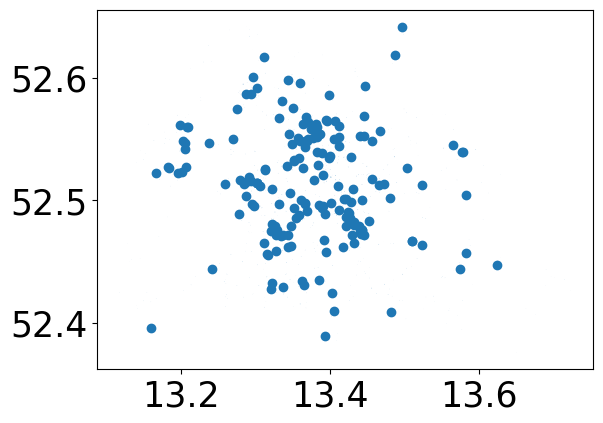

In [ ]:
place_of_worship.plot()

In [ ]:
# find place_of_worship counts in the grid
masks_place_of_worship = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = place_of_worship.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_place_of_worship.append(pip_mask)

#place_of_worship counts to the dataframe
place_of_worship_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    place_of_worship_count.append(place_of_worship[masks_place_of_worship[i]].shape[0])

berlin_polyframe_lat_long_new['place_of_worship_count'] = place_of_worship_count


100%|██████████| 3891/3891 [00:02<00:00, 1584.67it/s]


#### Detailed CSV SAVE

In [ ]:
# save the dataframe
berlin_polyframe_lat_long_new.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/processed/{name}_data_detailed.csv")